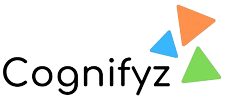

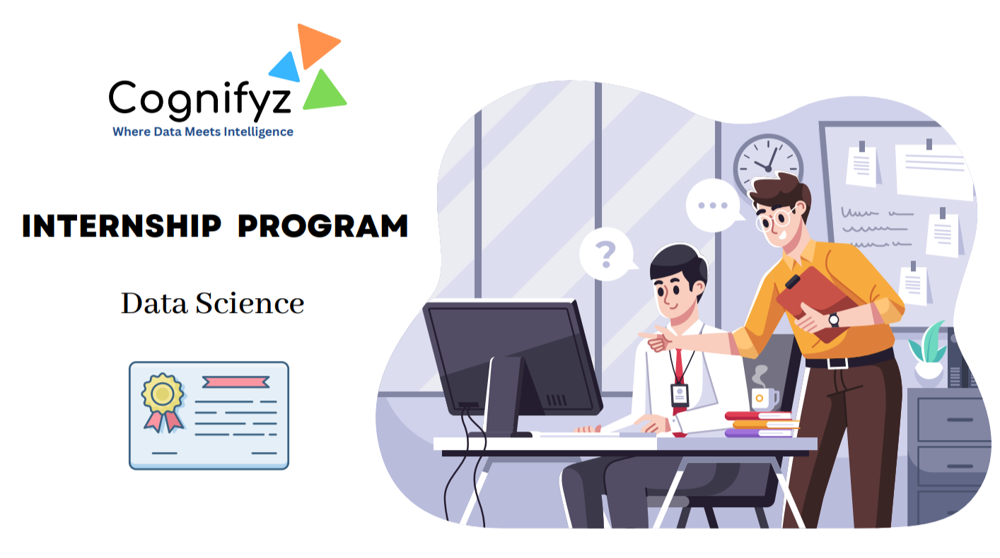

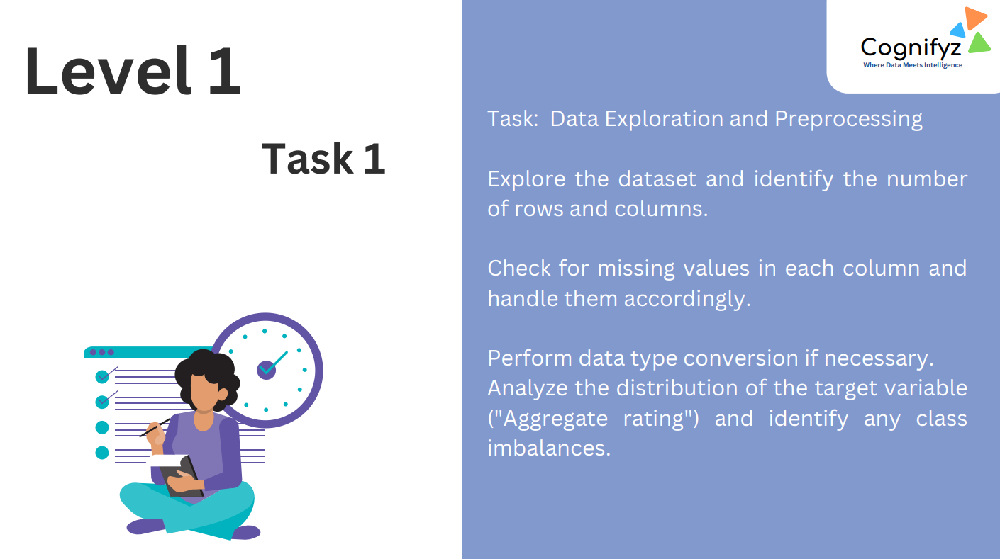

# Task 1: Data Exploration and Preprocessing

1. Explore the dataset and identify the number of rows and columns.


2. Check for missing values in each column and handle them accordingly.


3. Perform data type conversion if necessary.


4. Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances.

# Importing Required Libraries

In [104]:
import numpy as np
import pandas as pd 
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Loading Dataset

In [105]:
df=pd.read_csv('cognifyz Dataset .csv')
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


# Exploratory Data Analysis [EDA]

##### 1. Explore the dataset and identify the number of rows and columns.

In [106]:
df.shape

(9551, 21)

In [107]:
print("Our Dataset Has :-")
print(df.shape[0], "No Of Rows")
print(df.shape[1], "No Of Columns")

Our Dataset Has :-
9551 No Of Rows
21 No Of Columns


In [108]:
df.columns.to_list()

['Restaurant ID',
 'Restaurant Name',
 'Country Code',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Longitude',
 'Latitude',
 'Cuisines',
 'Average Cost for two',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Price range',
 'Aggregate rating',
 'Rating color',
 'Rating text',
 'Votes']

List of all the columns present in the dataset.

##### 2. Check for missing values in each column and handle them accordingly.

In [109]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

Here we can see that column "Cuisines" has 9 null values we need to treat them.

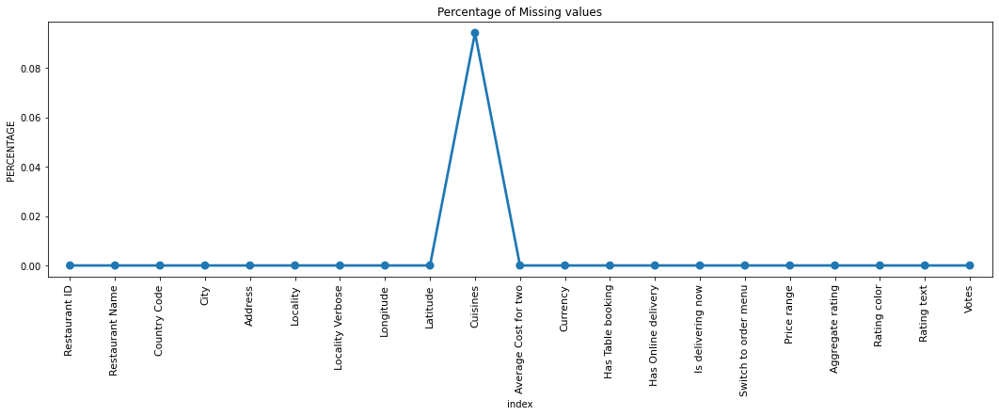

In [110]:
#Visualization for the missing values 
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(18,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =11)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

In [111]:
print(df['Cuisines'].nunique())
print(df['Cuisines'].unique())

1825
['French, Japanese, Desserts' 'Japanese'
 'Seafood, Asian, Filipino, Indian' ... 'Burger, Izgara'
 'World Cuisine, Patisserie, Cafe' 'Italian, World Cuisine']


There are total total 1825 values present in the "cuisines" column and we cannot use mode function here to fill the NaN values because every country has their own different different dishes which may not be provided in another country so we can either drop null values from the dataset or replace NaN values with "No Cuisines"

In [112]:
df['Cuisines']=df['Cuisines'].fillna("No Cuisines")

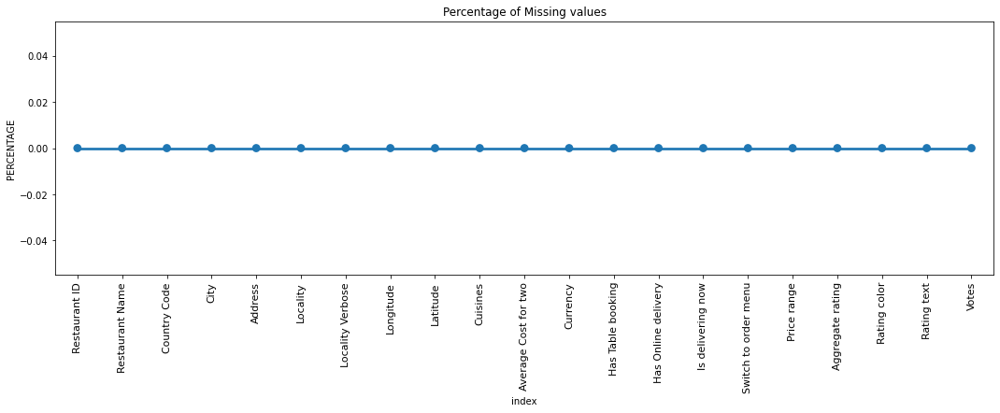

In [113]:
#Visualization for the missing values 
missing = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(18,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation =90,fontsize =11)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

In [114]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

Now we can see here that there are no null values present in the dataset.

##### 3. Perform data type conversion if necessary.

In [115]:
#check for the data types present in the dataset
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

After looking at the data types we can see that there is no need for any data type conversion 

##### 4. Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances.

In [116]:
check_for_imbalance=df['Aggregate rating'].value_counts()
print(check_for_imbalance)

0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64


In [117]:
df['Aggregate rating'].nunique()

33

In [118]:
df['Aggregate rating'].unique()

array([4.8, 4.5, 4.4, 4.9, 4. , 4.2, 4.3, 3.6, 4.7, 3. , 3.8, 3.7, 3.2,
       3.1, 0. , 4.1, 3.3, 4.6, 3.9, 3.4, 3.5, 2.2, 2.9, 2.4, 2.6, 2.8,
       2.1, 2.7, 2.5, 1.8, 2. , 2.3, 1.9])

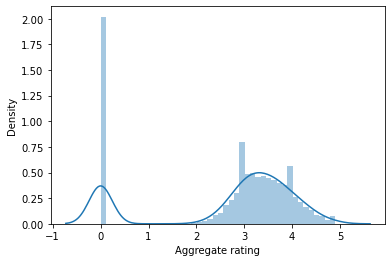

In [119]:
sns.distplot(df['Aggregate rating'])
plt.plot(figsize=(20,30))
plt.show()

In [120]:
class_imbalance=check_for_imbalance/len(df)*100
print("Class imbalance (%):")
class_imbalance

Class imbalance (%):


0.0    22.489792
3.2     5.465396
3.1     5.433986
3.4     5.214114
3.3     5.057062
3.5     5.025652
3.0     4.900010
3.6     4.795309
3.7     4.470736
3.8     4.188043
2.9     3.989111
3.9     3.507486
2.8     3.298084
4.1     2.868810
4.0     2.785049
2.7     2.617527
4.2     2.313894
2.6     1.999791
4.3     1.821799
4.4     1.507696
2.5     1.151712
4.5     0.994660
2.4     0.910899
4.6     0.816668
4.9     0.638677
2.3     0.492095
4.7     0.439745
2.2     0.282693
4.8     0.261753
2.1     0.157052
2.0     0.073291
1.9     0.020940
1.8     0.010470
Name: Aggregate rating, dtype: float64

After Analyzing the Aggregate rating column we can say that class imbalances & skewness is present in the target variable.

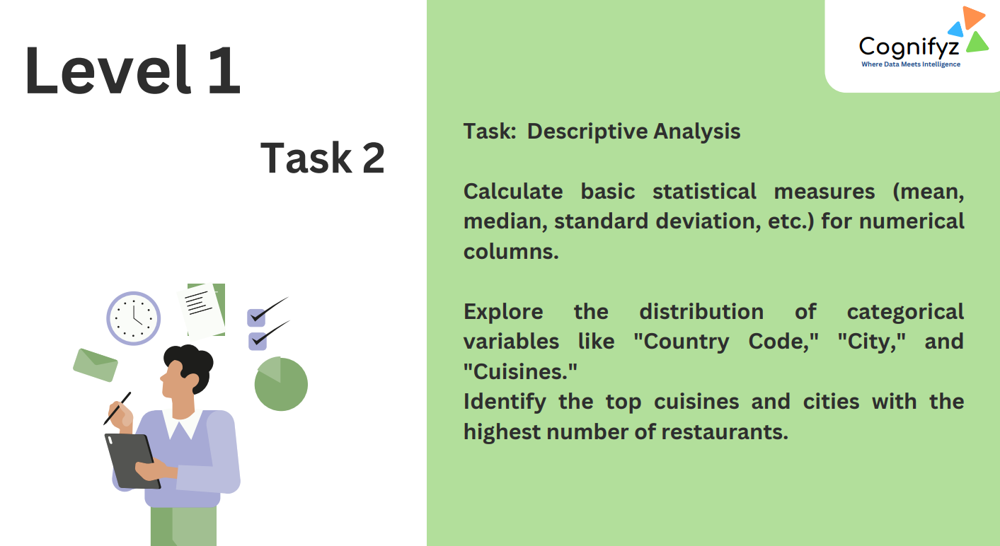

# Task 2 : Descriptive Analysis

1. Calculate basic statistical measures (mean,median, standard deviation, etc.) for numerical columns.


2. Explore the distribution of categorical variables like "Country Code", "City", and"Cuisines".


3. Identify the top cuisines and cities with the highest number of restaurants.

##### 1. Calculate basic statistical measures (mean,median, standard deviation, etc.) for numerical columns.

###### Seprating Numerical and categorical column

###### categorical columns

In [121]:
#Create a blank list name "categorical_col"
categorical_col=[]

#check for dtypes present in the dataset we use for loop
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print(categorical_col)

['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Rating color', 'Rating text']


In [122]:
len(categorical_col)

13

There are total 13 categorical columns present in the dataset.

###### Numerical columns

In [123]:
#Create a blank list name "numerical_col"
numerical_col=[]

#check for dtypes present in the dataset we use for loop
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print(numerical_col)

['Restaurant ID', 'Country Code', 'Longitude', 'Latitude', 'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes']


In [124]:
len(numerical_col)

8

There are total 8 numerical columns present in the dataset.

In [125]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Restaurant ID,9551.0,9.051128e+06,8.791521e+06,53.000000,301962.500000,6.004089e+06,1.835229e+07,1.850065e+07
Country Code,9551.0,1.836562e+01,5.675055e+01,1.000000,1.000000,1.000000e+00,1.000000e+00,2.160000e+02
Longitude,9551.0,6.412657e+01,4.146706e+01,-157.948486,77.081343,7.719196e+01,7.728201e+01,1.748321e+02
Latitude,9551.0,2.585438e+01,1.100794e+01,-41.330428,28.478713,2.857047e+01,2.864276e+01,5.597698e+01
Average Cost for two,9551.0,1.199211e+03,1.612118e+04,0.000000,250.000000,4.000000e+02,7.000000e+02,8.000000e+05
Price range,9551.0,1.804837e+00,9.056088e-01,1.000000,1.000000,2.000000e+00,2.000000e+00,4.000000e+00
Aggregate rating,9551.0,2.666370e+00,1.516378e+00,0.000000,2.500000,3.200000e+00,3.700000e+00,4.900000e+00
Votes,9551.0,1.569097e+02,4.301691e+02,0.000000,5.000000,3.100000e+01,1.310000e+02,1.093400e+04


By using describe function we can see the statistical measure of all the numerical columns.

we observe the following information:-

1. count for each of the columns is same which means that there are no null values present in the dataset.


2. In columns "country code", "Average Cost for two", "Votes" mean is greater than median which means that skewness is present and data is skewed to the right in this columns.


3. In columns "Longitude", "Latitude", "price range", "Aggregate rating" mean is less than median which means that the data is skewed to the left in this columns.


4. There is a huge difference between 75th percentile and max values so we can say that outliers are present in the dataset.


5. We can also observe std., min., 25th, 50th, 75th, and max values for each of the columns

##### 2. Explore the distribution of categorical variables like "Country Code", "City", and"Cuisines".

In [126]:
for i in categorical_col:
    print("Column Name =", i)
    print(df[i].value_counts())
    print( "#" * 100)

Column Name = Restaurant Name
Cafe Coffee Day             83
Domino's Pizza              79
Subway                      63
Green Chick Chop            51
McDonald's                  48
                            ..
Odeon Social                 1
Johnny Rockets               1
House of Commons             1
HotMess                      1
Walter's Coffee Roastery     1
Name: Restaurant Name, Length: 7446, dtype: int64
####################################################################################################
Column Name = City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64
####################################################################################################
Column Name = Address
Dilli Haat, INA, New De

##### 3. Identify the top cuisines and cities with the highest number of restaurants

In [127]:
Top_cuisines= df['Cuisines'].value_counts().nlargest()
print(Top_cuisines)

North Indian             936
North Indian, Chinese    511
Chinese                  354
Fast Food                354
North Indian, Mughlai    334
Name: Cuisines, dtype: int64


In [128]:
Top_cities= df['City'].value_counts().nlargest()
print(Top_cities)

New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
Name: City, dtype: int64


# 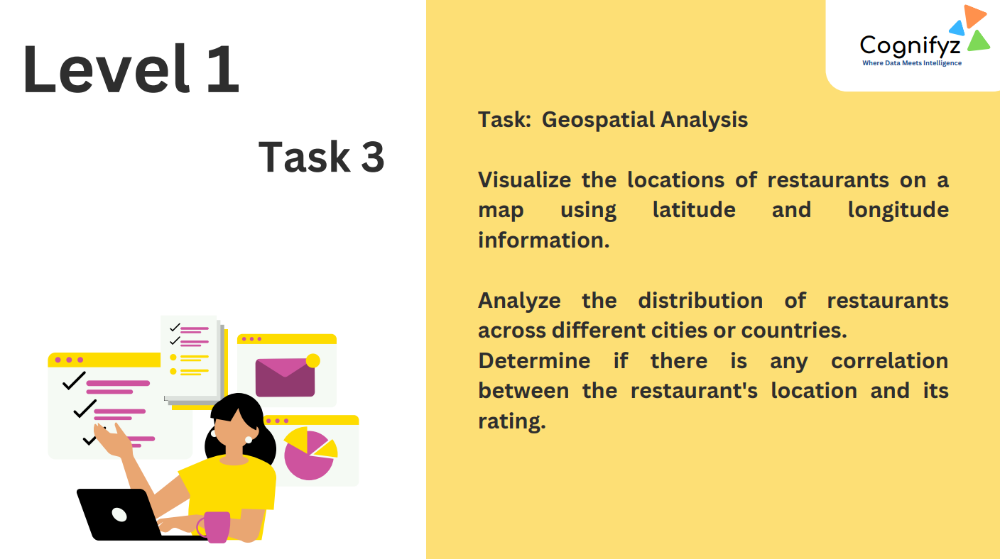

# Task 3: Geospatial Analysis

1. Visualize the locations of restaurants on a map using latitude and longitude information.


2. Analyze the distribution of restaurants across different cities or countries.


3. Determine if there is any correlation between the restaurant's location and its rating.

##### 1. Visualize the locations of restaurants on a map using latitude and longitude information

In [129]:
import folium

In [130]:
# Extracting the coordinates of the first restaurant
initial_location = [df['Latitude'].iloc[0], df['Longitude'].iloc[0]]

# Creating a Folium map centered at the initial restaurant location
restaurant_map = folium.Map(location=initial_location, zoom_start=12)

# Adding markers for each restaurant on the map
for index, restaurant_info in df.iterrows():
    # Extracting latitude, longitude, and name of the restaurant for the current row
    latitude, longitude, restaurant_name = restaurant_info['Latitude'], restaurant_info['Longitude'], restaurant_info['Restaurant Name']
    
    # Creating a marker with a different icon and prefix
    marker = folium.Marker(
        location=[latitude, longitude],
        popup=restaurant_name,
        icon=folium.Icon(icon='leaf', prefix='fa') 
    )
    
    # Adding the marker to the map
    marker.add_to(restaurant_map)

# Displaying the restaurant map
restaurant_map


In [131]:
pip install geopandas

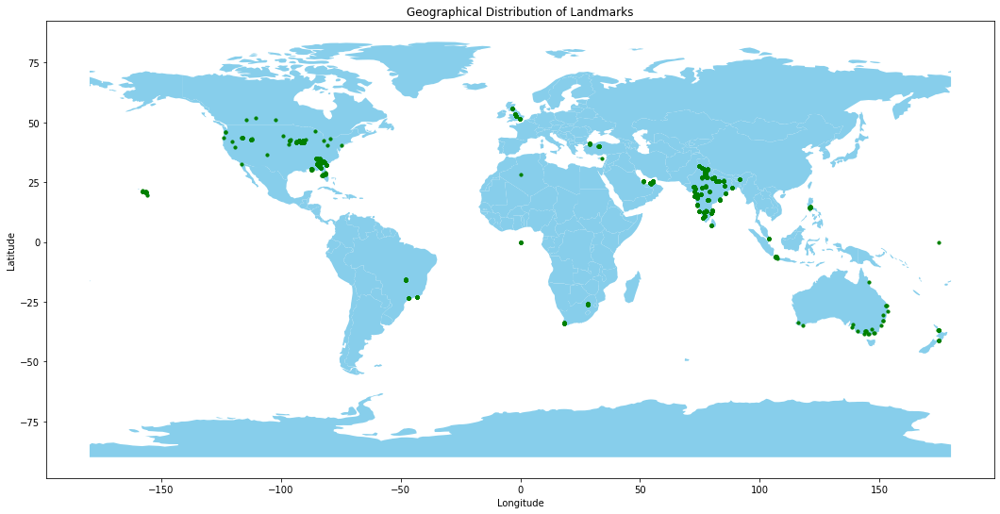

In [132]:
# Visualizing the distribution of landmarks
import geopandas as gpd

# Creating a GeoDataFrame with landmark locations
landmark_geo_df = gpd.GeoDataFrame(geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']))

# Reading a low-resolution world map for context
world_map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Setting up the plot with a larger figure size
fig, ax = plt.subplots(figsize=(18, 18))

# Plotting the world map with a light blue color
world_map.plot(ax=ax, color='skyblue')

# Plotting the landmark locations with red markers
landmark_geo_df.plot(ax=ax, color='green', markersize=10)

# Setting the title and axis labels
ax.set_title('Geographical Distribution of Landmarks')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Displaying the plot
plt.show()


##### 2. Analyze the distribution of restaurants across different cities or countries.

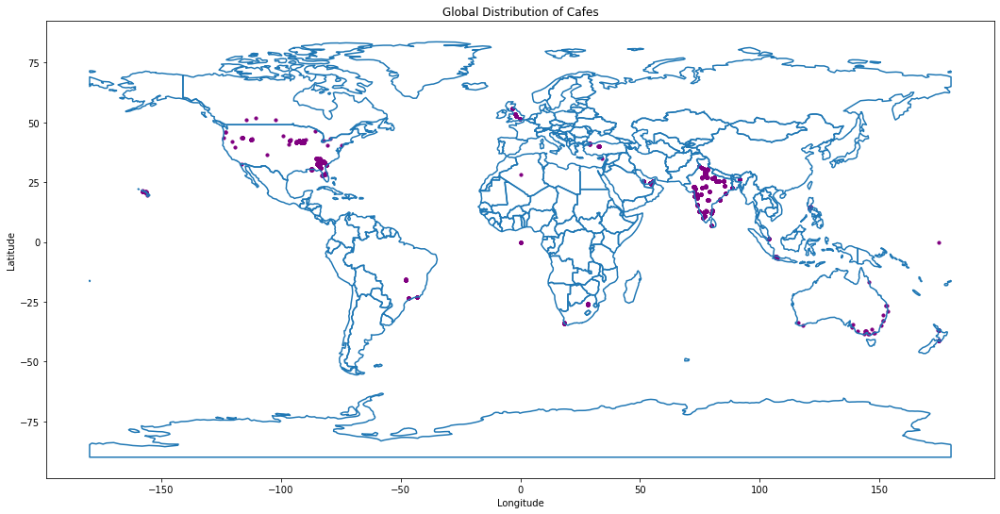

In [133]:
# Analyzing the global spread of cafes.
ax_cafes = world_map["geometry"].boundary.plot(figsize=(18, 14))

# Plotting cafe locations on the world map
geo_df.plot(ax=ax_cafes, color='purple', markersize=10)

# Adding a customized title and axis labels
ax_cafes.set_title('Global Distribution of Cafes')
ax_cafes.set_xlabel('Longitude')
ax_cafes.set_ylabel('Latitude')

# Displaying the map with cafe locations
plt.show()


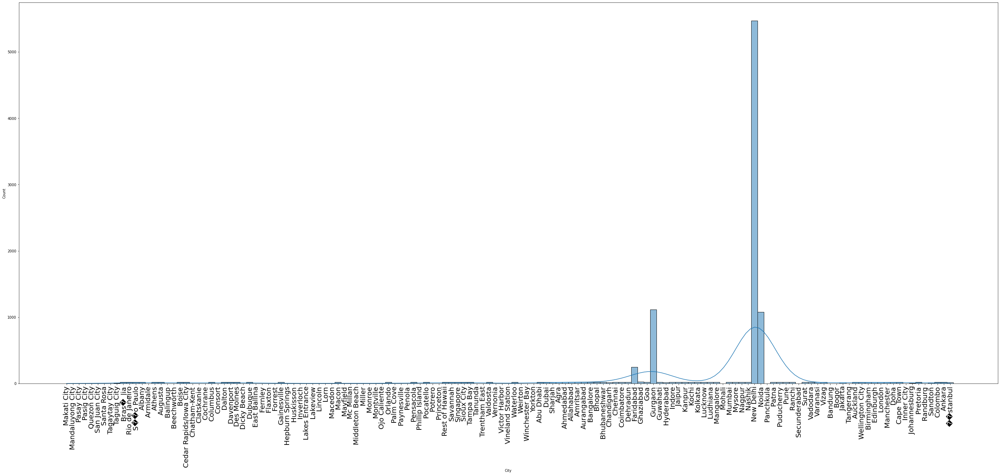

New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Armidale               1
Tagaytay City          1
Randburg               1
Quezon City            1
Vineland Station       1
Name: City, Length: 141, dtype: int64


In [134]:
# Increase the figure size before creating the plot
plt.figure(figsize=(50, 20))
# Use sns.histplot to create the histogram
sns.histplot(df['City'], kde=True)
# Rotate x-axis labels using plt.xticks
plt.xticks(rotation=90, fontsize=20)
plt.show()
print(df['City'].value_counts().sort_values(ascending=False))

Here we can see the distribution of the restaurants according to the city and observed that "New Delhi " has highest number of restaurants and "Vineland station" has lowest number of restaurants.

##### 3. Determine if there is any correlation between the restaurant's location and its rating.

In [135]:
correlation=df[['Longitude','Latitude','Aggregate rating']].corr()
print(correlation)

                  Longitude  Latitude  Aggregate rating
Longitude          1.000000  0.043207         -0.116818
Latitude           0.043207  1.000000          0.000516
Aggregate rating  -0.116818  0.000516          1.000000


<AxesSubplot:>

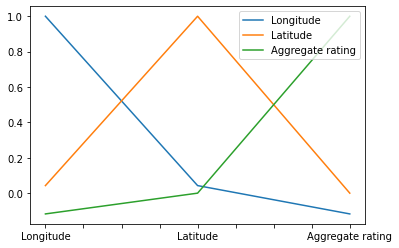

In [136]:
#correlation between the restaurant's location and its rating.
correlation.plot()

<AxesSubplot:>

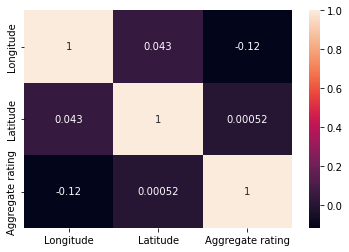

In [137]:
sns.heatmap(correlation, annot=True)

1. Longitude and Latitude:
Very weak positive correlation (0.043207). 
Slight tendency for Longitude and Latitude to increase together, but the correlation is not strong.



2. Longitude and Aggregate Rating:
Weak negative correlation (-0.116818).
Slight tendency for Aggregate Rating to decrease slightly as Longitude increases, but the correlation is not strong.



3. Latitude and Aggregate Rating:
Extremely weak positive correlation (0.000516).
Almost no discernible relationship between Latitude and Aggregate Rating.